In [36]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
import sys
import glob
import json
import os
from pprint import pprint

In [5]:
sys.path.append("./functions")

In [6]:
# Plotting
import matplotlib
#matplotlib.use('Qt5Agg')

In [7]:
import matplotlib.pyplot as plt
import matplotlib.transforms as mtransforms
import cartopy.crs as ccrs

In [9]:
from matplotlib import cm
import hvplot.pandas
import seaborn as sns
import bokeh.palettes as palettes
import holoviews as hv
hv.extension('bokeh', 'matplotlib')

import pandas as pd
import numpy as np
#import pyarrow
import scipy
from scipy.special import exp10
from tslearn.clustering import TimeSeriesKMeans, KShape
from tslearn.metrics import dtw
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.clustering import silhouette_score
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [86]:
from preproc_functions import prep_cluster_data, prep_preprocessed_cluster_data, get_whole_cloud_df, get_pred_dfs
from plotting_functions import get_cluster_traj_plts, get_whole_cloud_parameter_space_plts
from clustering_functions import load_model
from helper_functions import percentile, sel_cloud_center, round_to_multiple

In [12]:
%matplotlib inline

## Kwargs / dicts / meta data

In [146]:
cluster_labels = {"0_in-situ": "in situ",
                  "1_hybrid": "hybrid", 
                  "2_liquid-origin_thin": "liquid origin (thin)", 
                  "3_liquid-origin_thick": "liquid origin (thick)",
                  "1_low": "low ω regime",
                  "2_medium": "medium ω regime",
                  "3_high": "high ω regime"}

plt_options = {'fontsize': {'xlabel': 15,
      'ylabel': 15,
      'clabel': 15,
      'ticks': 15,
      'legend': 15,
      'title': 25}}

temp_colors = list(palettes.Spectral4)
omega_colors = tuple(np.flip(np.array(list(palettes.Purples9)))[[3,6,8]])

units = dict(iwc="[mg m⁻³]",iwc_log="log10 [mg m⁻³]", icnc_5um="[cm⁻³]",icnc_5um_log="log10 [cm⁻³]", dust="[mg kg-1]",T="[K]")
var_names = dict(iwc="IWC", icnc_5um="$N_{{ice}}$", dust="Dust > 1 μm",T="Temperature")

In [358]:
# TODO specify directory containing model files
MODEL_DIR = "/net/n2o/wolke_scratch2/kjeggle/ClusteringSubmissionData/cluster_models"

In [359]:
# TODO specify directory containing dataframes
DATA_DIR = "/net/n2o/wolke_scratch2/kjeggle/ClusteringSubmissionData"

## Load Data

In [21]:
df = pd.read_feather(DATA_DIR+"/cirrus_cloud_trajectories.ftr")

In [96]:
# create dataframe with only trajectory startpoints
start_points_df = df.query("timestep==0")

In [97]:
# round temperature and omega → used for analysis and plotting
start_points_df["T_rounded"] = start_points_df["T"].round()
start_points_df["OMEGA_rounded"] = start_points_df["OMEGA"].round(2)

/tmp/ipykernel_26592/2798541463.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  start_points_df["T_rounded"] = start_points_df["T"].round()
/tmp/ipykernel_26592/2798541463.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  start_points_df["OMEGA_rounded"] = start_points_df["OMEGA"].round(2)


In [98]:
# add region variable
start_points_df.insert(len(start_points_df.columns), "region", "mid_latitudes")# traj_df.lat_top
start_points_df.loc[start_points_df.lat<30, "region"] = "tropics"
start_points_df.loc[start_points_df.lat>60, "region"] = "polar"

### load cloud clusters

this is an example for the temperature clusters - running the logic for omega clusters works analogously

In [ ]:
# use all cloud ids
cloud_ids = start_points_df.cloud_id.unique()

#### Option I: create clustering input data from scratch (takes a lot of time and memory)

In [ ]:
### running this cell will take some time ###
# create dataframe and arrays used as clustering input
traj_df, traj_array, X = prep_cluster_data(df[df.cloud_id.isin(cloud_ids)],
                                        ["T_top","T_base"], 
                                        cloud_ids) 

#### Option II (recommended): load precomputed clustering input data

In [117]:
traj_df = pd.read_feather(DATA_DIR+"/cluster_input_data.ftr")
traj_array, X = prep_preprocessed_cluster_data(traj_df, clustering_features=["T_top","T_base"])

### Predict clusters

#### Option I: Used trained timeseries k-means model to predict clusters

the example below used the temperature clustering model with *k=4*

In [374]:
# load trained model
model_id = "temperature_clustering_k4"
model, _ = load_model(model_id,model_path=MODEL_DIR)

sample cloud_id: 2007-01-03 04:00:000.0-33.251.0


In [380]:
labels = model.predict(X)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 4000 out of 4000 | elapsed:    0.2s finished


In [299]:
cluster_pred_df, traj_df = get_pred_dfs(start_points_df, 
                                        traj_df, 
                                        traj_array, 
                                        labels,
                                        var="T")

/net/n2o/wolke/kjeggle/Repos/cloud_clustering/src/./functions/preproc_functions.py:40: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  traj_df = pd.merge(traj_df_, cluster_pred_df.drop(["trajectory_id_top","trajectory_id_base","T_rounded_base","T_rounded_top","OMEGA_rounded_base","OMEGA_rounded_top","DU_sup_log_base","DU_sup_log_top","nightday_flag_top","nightday_flag_base"],1), on="cloud_id")


In [302]:
# todo: save
traj_df.drop(["cluster_idx"],1).to_feather(DATA_DIR+"/cluster_input_data.ftr",compression_level=3)

/tmp/ipykernel_26592/1164901460.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  traj_df.drop(["cluster_idx"],1).to_feather(data_dir+"/cluster_input_data.ftr",compression_level=3)


#### Option II: load predicted clusters - contains cluster predictions for vertical velocity clusters as well

→ preferred option if you only want to do the plotting

In [347]:
# load saved cluster idxs
cluster_pred_df = pd.read_feather(os.path.join(DATA_DIR,"cluster_predictions.ftr"))

In [ ]:
# join cluster predictions to traj_df
traj_df = pd.merge(traj_df, cluster_pred_df[["cluster_idx","omega_cluster_idx","cloud_id"]],on="cloud_id")

### get data for whole cloud 
(i.e. all vertical levels instead of cloud top, center, base)

In [250]:
whole_cloud_df = get_whole_cloud_df(start_points_df, cluster_pred_df)

3_liquid-origin_thick    2950132
0_in-situ                2279070
1_hybrid                 1386384
2_liquid-origin_thin      575930
Name: cluster_idx, dtype: int64


## Name clusters

In [344]:
# based on model used in paper → name clusters
temp_cluster_map = {1: '3_liquid-origin_thick',
 0: '1_hybrid',
 2: '0_in-situ',
 3: '2_liquid-origin_thin'}

# name cluster indices
traj_df = traj_df.replace({"cluster_idx": temp_cluster_map})
whole_cloud_df = whole_cloud_df.replace({"cluster_idx": temp_cluster_map})
cluster_pred_df = cluster_pred_df.replace({"cluster_idx": temp_cluster_map})

In [ ]:
cluster_pred_df.head()#cloud_id.unique()#head()#.cluster_idx.value_counts()

In [ ]:
cluster_pred_df.reset_index(drop=True)[["cluster_idx","omega_cluster_idx","cloud_id"]].to_feather(DATA_DIR+"/cluster_predictions.ftr")

In [ ]:
cluster_pred_df.cloud_id.unique().shape

In [96]:
# join traj df 
traj_df = pd.merge(t_df, cluster_pred_df[["cluster_idx","omega_cluster_idx","cloud_id"]],on="cloud_id")

In [ ]:
# create whole cloud df
join_vars = ["trajectory_id","cloud_thickness_v2","dz_top_v2","lev","iwc","icnc_5um","icnc_100um","iwc_log","icnc_5um_log","icnc_100um_log","reffcli","liquid_origin","season","nightday_flag","T_rounded","OMEGA_rounded","DU_sup_log","DU_sub_log"]
whole_cloud_df = get_whole_cloud_df(cluster_pred_df)

In [ ]:
# add region column
traj_df.insert(len(traj_df.columns), "region", "mid_latitudes")# traj_df.lat_top
traj_df.loc[traj_df.lat_top<30, "region"] = "tropics"
traj_df.loc[traj_df.lat_top>60, "region"] = "polar"

In [ ]:
whole_cloud_df = pd.merge(whole_cloud_df,traj_df.query("timestep==0")[["cloud_id","region"]],on="cloud_id")

In [ ]:
cluster_pred_df = pd.merge(cluster_pred_df,traj_df.query("timestep==0")[["cloud_id","region"]],on="cloud_id")

In [ ]:
cluster_pred_df = cluster_pred_df.query("region != 'polar'")

In [ ]:
cluster_pred_df

In [ ]:
whole_cloud_df = whole_cloud_df.query("region != 'polar'")

In [ ]:
whole_cloud_df = pd.merge(whole_cloud_df, cluster_pred_df[["cloud_id","omega_cluster_idx"]], on="cloud_id")

In [ ]:
used_cloud_ids = cluster_pred_df.cloud_id.unique()

In [ ]:
top_traj_df = traj_df[traj_df.trajectory_id_top.isin(plt_traj_ids)]

In [ ]:
top_traj_df.groupby("trajectory_id_top").std()[["DU_sup_log_center","DU_sup_log_top","DU_sup_log_base","T_top"]].mean()

In [ ]:
top_traj_df.columns

In [ ]:
cluster_pred_df.iw

In [ ]:
cluster_pred_df.groupby(["region","cluster_idx","omega_cluster_idx"])[["iwc_top","iwc_base","icnc_5um_top","icnc_5um_base"]].describe()

In [ ]:
top_traj_df.query("region!='polar'").groupby(["region","cluster_idx","omega_cluster_idx"])[["T_top","OMEGA_center",]].describe()

## Create Paper Figures

### **Figure 1**: Sample Trajectories (on map)

* plot locations of 10.000 clouds with corresponsing trajecories

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
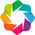

In [360]:
hv.extension("bokeh")

In [312]:
# select trajectory ids
n_trajs = 10000
one_traj_per_cloud = start_points_df.drop_duplicates("cloud_id", keep="first")
plt_traj_ids = one_traj_per_cloud.trajectory_id.unique()[:n_trajs]

In [313]:
all_traj_plt = traj_df[traj_df.trajectory_id_top.isin(plt_traj_ids)].hvplot.points(x='lon_top', 
                                                                                           y='lat_top', 
                                                                                           xlabel="Longitude", 
                                                                                           ylabel="Latitude", 
                                                                                           xlim=(-140,40),
                                                                                           ylim=(0,60),
                                                                                           **plt_options,
                                                                                           size=3,
                                                                                           alpha=0.4,
                                                                                           geo=True,
                                                                                           coastline=True,
                                                                                           crs=ccrs.PlateCarree(), 
                                                                                           projection=ccrs.PlateCarree(),
                                                                                           color='#A6CEE3')

In [314]:
all_start_point_plt = start_points_df[start_points_df.trajectory_id.isin(plt_traj_ids[:10000])].hvplot.points(x='lonr', 
                                                                                                              y='latr', 
                                                                                                              xlabel="Longitude [°E]", 
                                                                                                              ylabel="Latitude [°N]",
                                                                                                              geo=True,
                                                                                                              coastline=True,
                                                                                                              crs=ccrs.PlateCarree(), 
                                                                                                              projection=ccrs.PlateCarree(),
                                                                                                              ylim=(0,60),
                                                                                                              **plt_options,
                                                                                                              size=4,
                                                                                                              color="red")

In [315]:
trajectory_sample_plt = all_start_point_plt * all_traj_plt
trajectory_sample_plt.opts(frame_width=1800,fontscale=2)

:Overlay
   .Points.I     :Points   [lonr,latr]
   .Coastline.I  :Feature   [Longitude,Latitude]
   .Points.II    :Points   [lon_top,lat_top]
   .Coastline.II :Feature   [Longitude,Latitude]

### Figure 2: Sample trajectories

In [316]:
n_samples = 7
seed=7
np.random.seed(seed)
sample_cloud_ids = np.random.choice(cloud_ids, n_samples,replace=False)

In [317]:
sample_df = traj_df[traj_df.cloud_id.isin(sample_cloud_ids)]

In [318]:
sample_plt_color = list(palettes.Category10_7)

In [319]:
# Temperature
variable = "T"
temp_sample_plt = sample_df.hvplot.area(x="timestep",
                      y=f"{variable}_top",
                      y2=f"{variable}_base",
                      alpha=0.5,
                      by="cloud_id",
                      title="(a)",                  
                      stacked=False,
                      legend=False,
                      ylabel="Temperature [K]", 
                      xlabel="Timestep [h]",
                      ylim=(280,180),
                      width=400,
                      color=list(sample_plt_color),
                      **plt_options)

In [320]:
# Omega
omega_sample_plt = sample_df.hvplot.line(x="timestep",
                      y=f"OMEGA_center",
                      alpha=0.5,
                      by="cloud_id",
                      title="(b)",     
                      legend=False,
                      ylabel="Vertical velocity [Pa s⁻¹]", 
                      xlabel="Timestep [h]",
                      width=400,
                      color=sample_plt_color,
                      ylim=(0.5,-1.5),  
                      **plt_options)

In [321]:
# Dust
dust_center_sample_plt = sample_df.hvplot.line(x="timestep",
                      y=f"DU_sup_center",
                      alpha=0.5,
                      by="cloud_id",
                      title="(c)",     
                      legend=False,
                      ylabel=f'{var_names["dust"]} {units["dust"]}',
                      xlabel="Timestep [h]",
                      width=400,
                      logy=True,
                      color=sample_plt_color,
                      # ylim=(0.4,-0.4),  
                      **plt_options)

In [322]:
# display
traj_sample_plt = temp_sample_plt + omega_sample_plt + dust_center_sample_plt#dust_sample_plt
display(traj_sample_plt.opts(width=300))

:Layout
   .NdOverlay.I   :NdOverlay   [cloud_id]
      :Area   [timestep]   (T_top,T_base)
   .NdOverlay.II  :NdOverlay   [cloud_id]
      :Curve   [timestep]   (OMEGA_center)
   .NdOverlay.III :NdOverlay   [cloud_id]
      :Curve   [timestep]   (DU_sup_center)

### **Figure 6:** Spatial cluster distribution

In [323]:
cmap = palettes.Category20b_12[::-1]

In [349]:
p_df = traj_df.query("(timestep==0)&(lat_top<60)")
p_df["id"] = p_df["cluster_idx"] #+ "_" + p_df["omega_cluster_idx"]  
spatial_dist_plt = []
for cluster_idx,plt_id in zip(np.sort(p_df.id.unique()),["(a)","(b)","(c)","(d)"]):
    print(cluster_idx, plt_id)
    p = p_df.query(f"id=='{cluster_idx}'").hvplot.hexbin(x='lon_top', 
                                                         y='lat_top',
                                                         C="T_top",
                                                         xlabel="Longitude [°E]",
                                                         ylabel="Latitude [°N]",
                                                         title=f"{plt_id}  {cluster_labels[cluster_idx]} cluster",
                                                         xlim=(-140,40),
                                                         ylim=(-0.001,60.001),
                                                         gridsize=(56,24),
                                                         alpha=0.9,
                                                         width=1000,
                                                         coastline=True,
                                                         crs=ccrs.PlateCarree(), projection=ccrs.PlateCarree(),
                                                         # geo=True,
                                                         # project=True,
                                                         clabel= "Cirrus cloud count",
                                                         shared_axes=True,
                                                         cmap=cmap,
                                                         colorbar=True,
                                                         **plt_options).opts(yticks=np.linspace(0,60,7))#.cols(2)
    
    spatial_dist_plt.append(p)

/tmp/ipykernel_26592/2213515837.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p_df["id"] = p_df["cluster_idx"] #+ "_" + p_df["omega_cluster_idx"]


0_in-situ (a)
1_hybrid (b)
2_liquid-origin_thin (c)
3_liquid-origin_thick (d)


:Layout
   .Overlay.I   :Overlay
      .HexTiles.I  :HexTiles   [lon_top,lat_top]   (T_top)
      .Coastline.I :Feature   [Longitude,Latitude]
   .Overlay.II  :Overlay
      .HexTiles.I  :HexTiles   [lon_top,lat_top]   (T_top)
      .Coastline.I :Feature   [Longitude,Latitude]
   .Overlay.III :Overlay
      .HexTiles.I  :HexTiles   [lon_top,lat_top]   (T_top)
      .Coastline.I :Feature   [Longitude,Latitude]
   .Overlay.IV  :Overlay
      .HexTiles.I  :HexTiles   [lon_top,lat_top]   (T_top)
      .Coastline.I :Feature   [Longitude,Latitude]
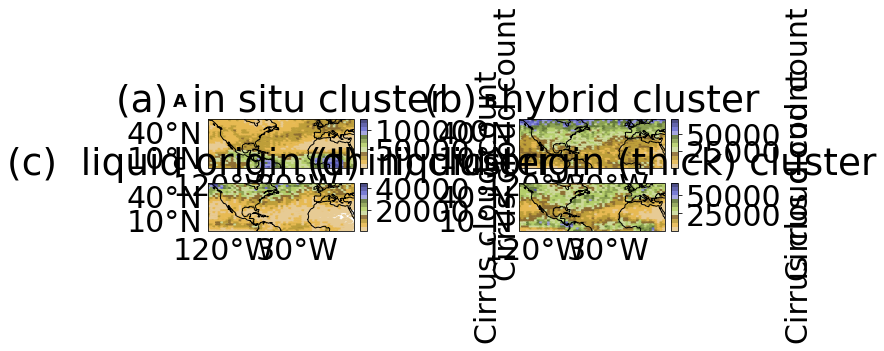

In [350]:
dist_plt = (spatial_dist_plt[0].opts(fontscale=1.5) + spatial_dist_plt[1].opts(fontscale=1.5) + spatial_dist_plt[2].opts(fontscale=1.5) + spatial_dist_plt[3].opts(fontscale=1.5)).cols(2)
display(dist_plt)

### **Figure 4:** Temp Median Cluster Trajectories

In [351]:
plt_options ={'fontsize': {'xlabel': 20,
              'ylabel': 20,
              'clabel': 20,
              'ticks': 20,
              'legend': 20,
              'title': 25}}

In [352]:
region="tropics"
t_temp_plt, omega_plt, dust_plt = get_cluster_traj_plts(traj_df.query(f"region == '{region}'") ,colors=temp_colors,cluster_col="cluster_idx")

region="mid_latitudes"
m_temp_plt, omega_plt, dust_plt = get_cluster_traj_plts(traj_df.query(f"region == '{region}'") ,colors=temp_colors,cluster_col="cluster_idx")

/net/n2o/wolke/kjeggle/Repos/cloud_clustering/src/./functions/plotting_functions.py:59: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  cluster_timestep_median = traj_df.groupby([cluster_col,"timestep"]).median().reset_index()


0 0_in-situ
1 1_hybrid
2 2_liquid-origin_thin
3 3_liquid-origin_thick


/net/n2o/wolke/kjeggle/Repos/cloud_clustering/src/./functions/plotting_functions.py:59: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  cluster_timestep_median = traj_df.groupby([cluster_col,"timestep"]).median().reset_index()


0 0_in-situ
1 1_hybrid
2 2_liquid-origin_thin
3 3_liquid-origin_thick


:Layout
   .Overlay.I   :Overlay
      .Curve.I      :Curve   [timestep]   (T_top_mean)
      .ErrorBars.I  :ErrorBars   [timestep]   (T_top_mean,T_top_std)
      .Curve.II     :Curve   [timestep]   (T_base_mean)
      .ErrorBars.II :ErrorBars   [timestep]   (T_base_mean,T_base_std)
      .Area.I       :Area   [timestep]   (T_top_mean,T_base_mean)
      .HLine.I      :HLine   [x,y]
   .Overlay.II  :Overlay
      .Curve.I      :Curve   [timestep]   (T_top_mean)
      .ErrorBars.I  :ErrorBars   [timestep]   (T_top_mean,T_top_std)
      .Curve.II     :Curve   [timestep]   (T_base_mean)
      .ErrorBars.II :ErrorBars   [timestep]   (T_base_mean,T_base_std)
      .Area.I       :Area   [timestep]   (T_top_mean,T_base_mean)
      .HLine.I      :HLine   [x,y]
   .Overlay.III :Overlay
      .Curve.I      :Curve   [timestep]   (T_top_mean)
      .ErrorBars.I  :ErrorBars   [timestep]   (T_top_mean,T_top_std)
      .Curve.II     :Curve   [timestep]   (T_base_mean)
      .ErrorBars.II :ErrorBars   [timestep]   (T_base_mean,T_base_std)
      .Area.I       :Area   [timestep]   (T_top_mean,T_base_mean)
      .HLine.I      :HLine   [x,y]
   .Overlay.IV  :Overlay
      .Curve.I      :Curve   [timestep]   (T_top_mean)
      .ErrorBars.I  :ErrorBars   [timestep]   (T_top_mean,T_top_std)
      .Curve.II     :Curve   [timestep]   (T_base_mean)
      .ErrorBars.II :ErrorBars   [timestep]   (T_base_mean,T_base_std)
      .Area.I       :Area   [timestep]   (T_top_mean,T_base_mean)
      .HLine.I      :HLine   [x,y]
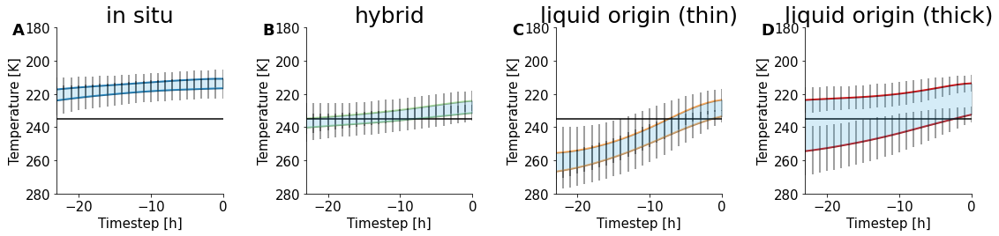

In [353]:
# display mid latitudes
m_temp_plt

:Layout
   .Overlay.I   :Overlay
      .Curve.I      :Curve   [timestep]   (T_top_mean)
      .ErrorBars.I  :ErrorBars   [timestep]   (T_top_mean,T_top_std)
      .Curve.II     :Curve   [timestep]   (T_base_mean)
      .ErrorBars.II :ErrorBars   [timestep]   (T_base_mean,T_base_std)
      .Area.I       :Area   [timestep]   (T_top_mean,T_base_mean)
      .HLine.I      :HLine   [x,y]
   .Overlay.II  :Overlay
      .Curve.I      :Curve   [timestep]   (T_top_mean)
      .ErrorBars.I  :ErrorBars   [timestep]   (T_top_mean,T_top_std)
      .Curve.II     :Curve   [timestep]   (T_base_mean)
      .ErrorBars.II :ErrorBars   [timestep]   (T_base_mean,T_base_std)
      .Area.I       :Area   [timestep]   (T_top_mean,T_base_mean)
      .HLine.I      :HLine   [x,y]
   .Overlay.III :Overlay
      .Curve.I      :Curve   [timestep]   (T_top_mean)
      .ErrorBars.I  :ErrorBars   [timestep]   (T_top_mean,T_top_std)
      .Curve.II     :Curve   [timestep]   (T_base_mean)
      .ErrorBars.II :ErrorBars   [timestep]   (T_base_mean,T_base_std)
      .Area.I       :Area   [timestep]   (T_top_mean,T_base_mean)
      .HLine.I      :HLine   [x,y]
   .Overlay.IV  :Overlay
      .Curve.I      :Curve   [timestep]   (T_top_mean)
      .ErrorBars.I  :ErrorBars   [timestep]   (T_top_mean,T_top_std)
      .Curve.II     :Curve   [timestep]   (T_base_mean)
      .ErrorBars.II :ErrorBars   [timestep]   (T_base_mean,T_base_std)
      .Area.I       :Area   [timestep]   (T_top_mean,T_base_mean)
      .HLine.I      :HLine   [x,y]
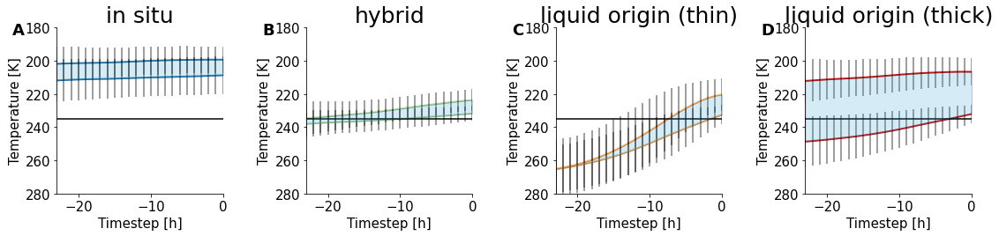

In [354]:
# display tropics
t_temp_plt

### **Figure 7:** Temp Cluster Parameter plots

In [330]:
%matplotlib inline

In [331]:
hv.extension('matplotlib')

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [332]:
min_bin_count = 2500 # display only values with minimum observations per bin
max_dz_top_v2 = 600 # use only layers close to cloud top

In [333]:
region="mid_latitudes"
midlats_param_plt, midlats_param_df = get_whole_cloud_parameter_space_plts(whole_cloud_df.query(f"region == '{region}'"),colors=temp_colors,quantile_lines=False,min_count=min_bin_count,max_dz_top_v2=max_dz_top_v2)

/net/n2o/wolke/kjeggle/Repos/cloud_clustering/src/./functions/plotting_functions.py:115: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  all_data_whole_cloud_parameter_space = whole_cloud_df.query(f"dz_top_v2 <= {max_dz_top_v2}").groupby("T_rounded",as_index=False).median().query("T_rounded>=200").query("T_rounded<=235")


In [334]:
region="tropics"
tropics_param_plt, tropics_param_df = get_whole_cloud_parameter_space_plts(whole_cloud_df.query(f"region == '{region}'"),colors=temp_colors,quantile_lines=False,min_count=min_bin_count,max_dz_top_v2=max_dz_top_v2)

/net/n2o/wolke/kjeggle/Repos/cloud_clustering/src/./functions/plotting_functions.py:115: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  all_data_whole_cloud_parameter_space = whole_cloud_df.query(f"dz_top_v2 <= {max_dz_top_v2}").groupby("T_rounded",as_index=False).median().query("T_rounded>=200").query("T_rounded<=235")


In [335]:
param_plt = (midlats_param_plt + tropics_param_plt).opts(fig_inches=5.5,tight=False,vspace=0.6,hspace=0.4,sublabel_format="({alpha})").cols(2)

In [336]:
# renderer = hv.renderer("matplotlib").instance(dpi=600)
param_plt = hv.render(param_plt)

In [337]:
param_plt.legend((['in situ', 'hybrid', 'liquid origin (thin)', 'liquid origin (thick)',"median"]),
                 loc="outside lower center",
                 prop={'size': 14},
                 ncols=5, 
                 mode="expand",
                 bbox_to_anchor=(0.1, 0.45, 0.8, .102),
                 borderaxespad=0.)

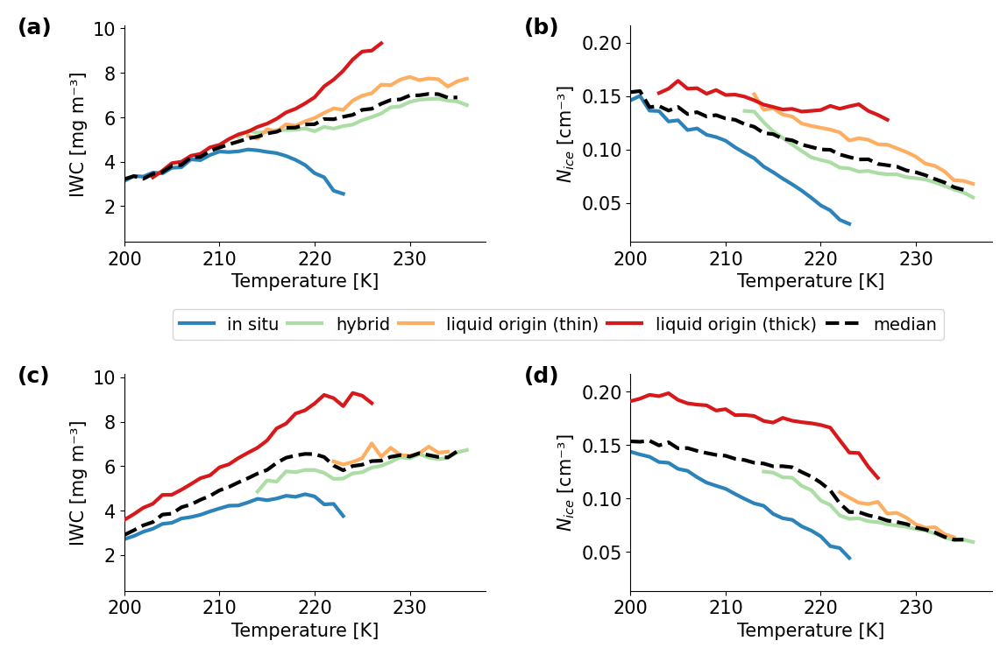

In [338]:
param_plt

#### Calculate relative change 

In [244]:
cluster_idx = "0_in-situ"
median_220 = midlats_param_df.query(f"cluster_idx=='{cluster_idx}'").query("T_rounded==220").reset_index(drop=True)[["iwc_median","icnc_5um_median","reffcli_median"]]
median_210 = midlats_param_df.query(f"cluster_idx=='{cluster_idx}'").query("T_rounded==210").reset_index(drop=True)[["iwc_median","icnc_5um_median","reffcli_median"]]

(median_220 - median_210) / median_210 * 100

,iwc_median,icnc_5um_median,reffcli_median
0,-21.858918,-56.011294,9.910528


In [245]:
cluster_idx = "3_liquid-origin_thick"
median_220 = midlats_param_df.query(f"cluster_idx=='{cluster_idx}'").query("T_rounded==220").reset_index(drop=True)[["iwc_median","icnc_5um_median","reffcli_median"]]
median_210 = midlats_param_df.query(f"cluster_idx=='{cluster_idx}'").query("T_rounded==210").reset_index(drop=True)[["iwc_median","icnc_5um_median","reffcli_median"]]

(median_220 - median_210) / median_210 * 100

,iwc_median,icnc_5um_median,reffcli_median
0,45.034857,-9.325044,12.107732


In [246]:
cluster_idx = "0_in-situ"
median_220 = tropics_param_df.query(f"cluster_idx=='{cluster_idx}'").query("T_rounded==220").reset_index(drop=True)[["iwc_median","icnc_5um_median","reffcli_median"]]
median_210 = tropics_param_df.query(f"cluster_idx=='{cluster_idx}'").query("T_rounded==210").reset_index(drop=True)[["iwc_median","icnc_5um_median","reffcli_median"]]

(median_220 - median_210) / median_210 * 100

,iwc_median,icnc_5um_median,reffcli_median
0,13.218636,-40.887707,13.148719


In [247]:
cluster_idx = "3_liquid-origin_thick"
median_220 = tropics_param_df.query(f"cluster_idx=='{cluster_idx}'").query("T_rounded==220").reset_index(drop=True)[["iwc_median","icnc_5um_median","reffcli_median"]]
median_210 = tropics_param_df.query(f"cluster_idx=='{cluster_idx}'").query("T_rounded==210").reset_index(drop=True)[["iwc_median","icnc_5um_median","reffcli_median"]]

(median_220 - median_210) / median_210 * 100

,iwc_median,icnc_5um_median,reffcli_median
0,48.360948,-8.060584,13.271185


### **Figure 8:** Omega Cluster Plots

In [339]:
region="tropics" # mid_latitudes - select region
omega_cluster = []
for cluster_idx in np.sort(cluster_pred_df.head(1000).cluster_idx.unique()):
    print(cluster_idx)
    t_temp_plt, omega_plt, dust_plt = get_cluster_traj_plts(traj_df.query(f"(region == '{region}')&(cluster_idx == '{cluster_idx}')") ,colors=omega_colors,cluster_col="omega_cluster_idx")
    param_plt, param_df = get_whole_cloud_parameter_space_plts(whole_cloud_df.query(f"(region == '{region}')&(cluster_idx == '{cluster_idx}')"),quantile_lines=False,min_count=500,max_dz_top_v2=350,cluster_col="omega_cluster_idx",colors=list(omega_colors))
    
    omega_cluster.append(omega_plt+param_plt)

3_liquid-origin_thick


KeyError: 'omega_cluster_idx'

In [ ]:
for i in range(len(omega_cluster)):
    for j in range(len(omega_cluster[i])):
        p_opts = dict(fontsize={"title":16, "xlabel":16,"ylabel":16,"ticks":16})
        if j < 3:
            ylim=(-1.5,0.2)
            p_opts["linewidth"]=3
            yticks=[0,-0.5,-1]
            xticks=[-20,-10,0]
        elif j == 3:
            ylim = (0,10)
            yticks = [2.5,5,7.5,10]
            xticks=[200,210,220,230]
        else:
            ylim = (0,0.2)
            yticks=[0,0.1,0.2]
            xticks=[200,210,220,230]
                
        # ylabel, xlabel
        if j in [1,2]:
            ylabel=""
            p_opts["ylabel"]=ylabel
        if i < 3:
            xlabel=""
            p_opts["xlabel"]=xlabel
            
            
        if (i==0) and (j==2):
            
            p_opts["xlim"]=(1000,2000)
            xticks=[0]
            p_opts["title"]=""
            ylim=(200,300)
        
        p_opts["xticks"]=xticks
        p_opts["yticks"]=yticks
        p_opts["ylim"]=ylim
        
            
        if j <3:
            omega_cluster[i][j].Curve.I.opts(**p_opts)
        else:
            omega_cluster[i][j].opts(**p_opts)

In [ ]:
omega_cluster_plt = hv.Layout(omega_cluster).cols(5).opts(hspace=0.7,fig_inches=(17,18))

In [ ]:
omega_cluster_plt = hv.render(omega_cluster_plt)

In [ ]:
omega_cluster_plt.legend((['low ω regime', 'medium ω regime', 'high ω regime']),
                 loc="outside lower center",
                 prop={'size': 24},
                 ncols=5, 
                 mode="expand",
                 bbox_to_anchor=(0.08, -0.06, 0.8, .102),
                 borderaxespad=0.)

In [ ]:
# adjust label size of param plots. for some reason they were larger
n = 0
for i in range(len(omega_cluster)):
    for j in range(len(omega_cluster[i])):
        if j > 2:
            omega_cluster_plt.axes[n].yaxis.label.set_size(16)
            omega_cluster_plt.axes[n].xaxis.label.set_size(16)
        n+=1

In [ ]:
omega_cluster_plt

### **Figure 9:** Dust parameter plt

In [258]:
min_dz_top = 0
max_dz_top = 325
rounding = 0.2

In [259]:
dust_xticks = [(-2, '10⁻²'), (-3, '10⁻³'), (-4, '10⁻⁴'), (-5, '10⁻⁵'), (-6, '10⁻⁶')]
iwc_ticks = np.linspace(0,8,5)
nice_ticks = np.linspace(0,0.15,4)
temp_ticks = np.linspace(190,230,5)


In [260]:
# prep df fo dust kdes
dust_kde_data = whole_cloud_df.query(f"(dz_top_v2 <= {max_dz_top})&(dz_top_v2 > {min_dz_top})").sort_values("cluster_idx")

In [261]:
dust_medians = whole_cloud_df.query(f"(dz_top_v2 <= {max_dz_top})&(dz_top_v2 > {min_dz_top})")
dust_medians["DU_sup_log_rounded"] = round_to_multiple(dust_medians[f"DU_sup_log"],rounding)
# dust_medians["DU_sub_log_rounded"] = round_to_multiple(dust_medians[f"DU_sub_log"],rounding)

dust_medians["id"] = dust_medians["cluster_idx"]

/tmp/ipykernel_26592/3714206952.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dust_medians["DU_sup_log_rounded"] = round_to_multiple(dust_medians[f"DU_sup_log"],rounding)
/tmp/ipykernel_26592/3714206952.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dust_medians["id"] = dust_medians["cluster_idx"]


In [262]:
# groupby id, region, dust bin
dust_medians = dust_medians.groupby(["id","region","DU_sup_log_rounded"])[["iwc","icnc_5um","timestep","T_rounded","OMEGA_rounded"]].agg({"iwc":np.median,"icnc_5um":np.median,"T_rounded":np.median,"timestep":"count","OMEGA_rounded":np.median}).reset_index()
dust_medians = dust_medians.query("timestep>=1000")

In [263]:
dust_param_plts = []
for region in ["mid_latitudes","tropics"]:#,"polar"]:
    # f"######### {region} ##########")
    #display_markdown(f"## {region.capitalize()}",raw=True)
    abs_plt = (dust_medians.query(f"region=='{region}'").hvplot.line(x="DU_sup_log_rounded",y="iwc",by="id",width=280,**plt_options,title="IWC median",linewidth=3,color=temp_colors,legend=False,ylabel=f"IWC {units['iwc']}",xlabel=f"{var_names['dust']} {units['dust']}",xticks=dust_xticks,yticks=iwc_ticks,ylim=(iwc_ticks.min(),iwc_ticks.max()))  +
               dust_medians.query(f"region=='{region}'").hvplot.line(x="DU_sup_log_rounded",y="icnc_5um",by="id",width=280,**plt_options,title="$N_{{ice}}$ median",linewidth=3,color=temp_colors,legend=False,ylabel=f"{var_names['icnc_5um']} {units['icnc_5um']}",xlabel=f"{var_names['dust']} {units['dust']}",xticks=dust_xticks,yticks=nice_ticks,ylim=(nice_ticks.min(),0.2)) +
               dust_medians.query(f"region=='{region}'").hvplot.line(x="DU_sup_log_rounded",y="T_rounded",by="id",width=280,**plt_options,title="Temperature median",linewidth=3,color=temp_colors,legend=False,ylabel=f"{var_names['T']} {units['T']}",xlabel=f"{var_names['dust']} {units['dust']}",xticks=dust_xticks,yticks=temp_ticks,ylim=(temp_ticks.min(),temp_ticks.max())) +
               dust_kde_data.query(f"region=='{region}'").hvplot.kde("DU_sup_log",by="cluster_idx",alpha=0.75,xlim=(-6,-1),**plt_options,title="Dust distribution",xlabel=f"{var_names['dust']} {units['dust']}",xticks=dust_xticks,facecolor=temp_colors,legend=False,width=280))
               # dust_medians.query(f"region=='{region}'").hvplot.line(x="DU_sup_log_rounded",y="OMEGA_rounded",by="id",width=600)
              # )
    #display(abs_plt)
    dust_param_plts.append(abs_plt)
    

In [264]:
dust_param_plt = (dust_param_plts[0] + dust_param_plts[1]).opts(fig_inches=5,tight=False,vspace=0.5,hspace=0.4,sublabel_format="({alpha})",sublabel_position=(-0.35, 0.975)).cols(4)

In [265]:
dust_param_plt = hv.render(dust_param_plt)

In [266]:
dust_param_plt.legend((['in situ', 'hybrid', 'liquid origin (thin)', 'liquid origin (thick)']),
                 loc="outside lower center",
                 prop={'size': 22},
                 ncols=5, 
                 mode="expand",
                 bbox_to_anchor=(0.1, 0.455, 0.8, .102),
                 borderaxespad=0.)

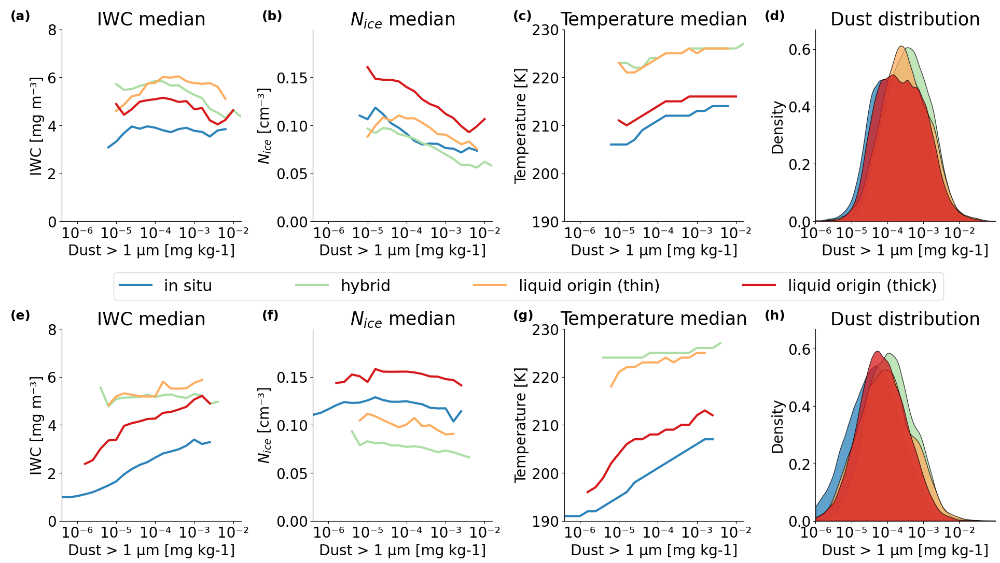

In [267]:
dust_param_plt

### **Figure 10:** Dust dependency - Temperature Cluster

In [268]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [269]:
dust_medians = whole_cloud_df.query(f"(dz_top_v2 <= {max_dz_top})&(dz_top_v2 > {min_dz_top})")
dust_medians["DU_sup_log_rounded"] = round_to_multiple(dust_medians[f"DU_sup_log"],rounding)
dust_medians["id"] = dust_medians["cluster_idx"]#+"_"+dust_medians["omega_cluster_idx"]#dust_medians["season"]#

/tmp/ipykernel_26592/1982781863.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dust_medians["DU_sup_log_rounded"] = round_to_multiple(dust_medians[f"DU_sup_log"],rounding)
/tmp/ipykernel_26592/1982781863.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dust_medians["id"] = dust_medians["cluster_idx"]#+"_"+dust_medians["omega_cluster_idx"]#dust_medians["season"]#


In [270]:
dust_medians = dust_medians.groupby(["id","region","DU_sup_log_rounded"])[["iwc","icnc_5um","timestep","T_rounded","OMEGA_rounded"]].agg({"iwc":np.median,"icnc_5um":np.median,"T_rounded":np.median,"timestep":"count","OMEGA_rounded":np.median}).reset_index()
dust_medians = dust_medians.query("timestep>=1000")

In [ ]:
# cluster by temperature
# dust_medians = dust_medians.groupby(["id","region","T_rounded"])[["iwc","icnc_5um","timestep","DU_sup_log_rounded","OMEGA_rounded"]].agg({"iwc":np.median,"icnc_5um":np.median,"DU_sup_log_rounded":np.median,"timestep":"count","OMEGA_rounded":np.median}).reset_index()
# dust_medians = dust_medians.query("timestep>=1000")

In [271]:
cluster_medians = dust_medians.groupby(["region","id"])[["iwc","icnc_5um","timestep","T_rounded","OMEGA_rounded"]].agg({"iwc":np.median,"icnc_5um":np.median,"T_rounded":np.median,"timestep":"count","OMEGA_rounded":np.median})#.reset_index()#.hvplot.heatmap(x="cluster_idx",y="region",c="iwc")

In [ ]:
# cluster_medians = dust_medians.groupby(["region","id"])[["iwc_log","icnc_5um_log","timestep","T_rounded","OMEGA_rounded"]].agg({"iwc_log":np.median,"icnc_5um_log":np.median,"T_rounded":np.median,"timestep":"count","OMEGA_rounded":np.median})#.reset_index()#.hvplot.heatmap(x="cluster_idx",y="region",c="iwc")

In [272]:
####################################################
########## We are converting cm-3 to 1/l ###############
####################################################

hm_dfs = dict()

for var in ["iwc","icnc_5um"]:
    print(f"############ {var} #############")
    rows = []
    for region in ["tropics", "mid_latitudes"]:
        for cluster in ["0_in-situ","1_hybrid","2_liquid-origin_thin","3_liquid-origin_thick"]:#dust_medians.id.unique():
            print(region, cluster)

            reg_df =  dust_medians.query(f"(region=='{region}')&(id=='{cluster}')")

            print(reg_df.count().id)
            if reg_df.count().id < 10: 
                rows.append([region, cluster, np.nan])
                continue



            model = smf.ols(formula=f"{var} ~ T_rounded + OMEGA_rounded + DU_sup_log_rounded",data=reg_df).fit()
            # display(model.summary())
            # print(model.params)
            print(model.pvalues)
            print(f"R2 {model.rsquared:.2f}")

            # select param based on p-values → significance
            params = [*model.params]
            pvals = [*model.pvalues]
            params = [param if pval < 0.05 else np.nan for pval,param in zip(pvals,params)]
            rows.append([region, cluster, *params])

            print("\n")
            
    print(rows)
    reg_coeffs_df = pd.DataFrame(rows,columns=["region","cluster", "constant","T_beta","OMEGA_beta","DU_beta"])
    hm_df = reg_coeffs_df.pivot(index="region", columns="cluster", values="DU_beta")
    hm_df = hm_df.reindex(["mid_latitudes","tropics"])

    hm_dfs[var] = hm_df

############ iwc #############
tropics 0_in-situ
20
Intercept             0.003653
T_rounded             0.000597
OMEGA_rounded         0.055771
DU_sup_log_rounded    0.355298
dtype: float64
R2 0.99


tropics 1_hybrid
16
Intercept             0.342270
T_rounded             0.420490
OMEGA_rounded         0.018803
DU_sup_log_rounded    0.386395
dtype: float64
R2 0.40


tropics 2_liquid-origin_thin
13
Intercept             0.356322
T_rounded             0.192622
OMEGA_rounded         0.807538
DU_sup_log_rounded    0.262913
dtype: float64
R2 0.78


tropics 3_liquid-origin_thick
17
Intercept             3.864466e-06
T_rounded             1.462875e-07
OMEGA_rounded         3.864466e-06
DU_sup_log_rounded    5.735179e-02
dtype: float64
R2 0.99


mid_latitudes 0_in-situ
16
Intercept             0.949006
T_rounded             0.733802
OMEGA_rounded         0.126122
DU_sup_log_rounded    0.854478
dtype: float64
R2 0.34


mid_latitudes 1_hybrid
17
Intercept             0.053080
T_rounded         

In [273]:
hm_plt_params = dict(iwc=dict(vmin=-1.5,vmax=1.5,fmt=".2f"),iwc_log=dict(vmin=-0.1,vmax=0.1,fmt=".4f"),icnc_5um=dict(vmin=-0.03e3,vmax=0.03e3,fmt=".2f"),icnc_5um_log=dict(vmin=-0.1e3,vmax=0.1e3,fmt=".4f"))
cluster_median_plt_params = dict(iwc=dict(vmin=0,vmax=6,fmt=".2f"),icnc_5um=dict(vmin=0,vmax=0.18,fmt=".2f"))
rel_change_plt_params = dict(vmin=-0.4,vmax=0.4,fmt=".0%",cmap="bwr")

In [274]:
matplotlib.rcParams.update({'font.size': 16})

In [278]:
if "0_in-situ_1_low" in dust_medians["id"].unique():
    figure_width = 16
else:
    figure_width = 8

In [279]:
figure_width

8

In [275]:
xticklabels = ['in situ', 'hybrid', 'liquid origin\n(thin)', 'liquid origin\n(thick)']
yticklabels = ["Midlatitudes","Tropics"]

In [281]:
%matplotlib inline

In [276]:
from matplotlib.ticker import PercentFormatter

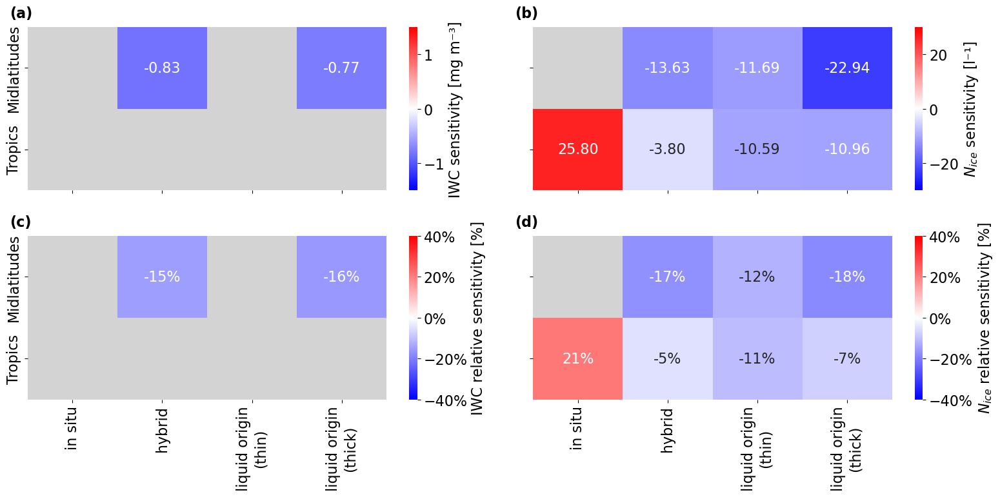

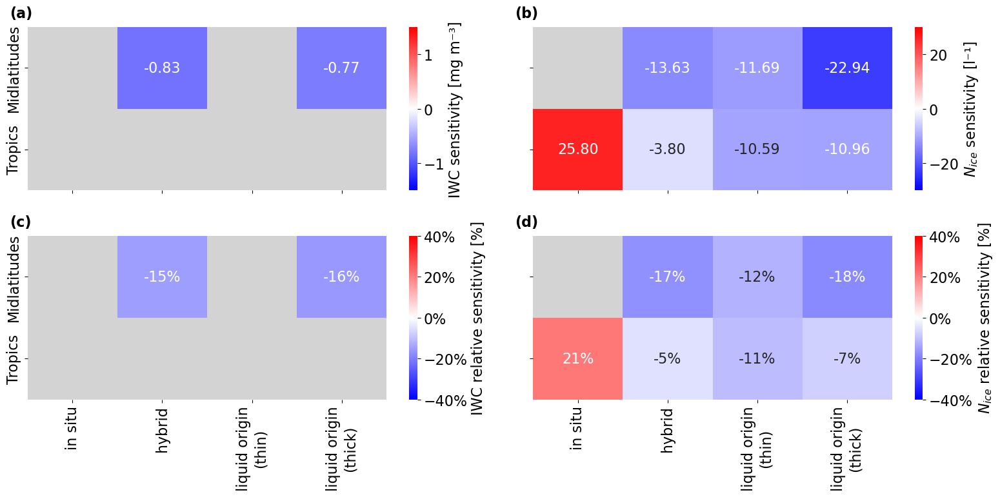

In [ ]:
fig, axes = plt.subplots(2,2,figsize=(figure_width*2,8)) 
axes = axes.flatten()

# regression params
var="iwc"
sns.heatmap(hm_dfs[var], annot=True, cmap="bwr",ax=axes[0], cbar_kws={"label":f"IWC sensitivity {units[var]}"},**hm_plt_params[var],xticklabels=["","","",""],yticklabels=yticklabels)

# convert cm-3 to l
var="icnc_5um"
sns.heatmap(hm_dfs[var]*1000, annot=True, cmap="bwr",ax=axes[1], cbar_kws={"label":f"$N_{{ice}}$ sensitivity [l⁻¹]"},**hm_plt_params[var],xticklabels=["","","",""],yticklabels=["",""])

# cluster medians
var="iwc"
cm = cluster_medians[var].unstack()
rel_change = hm_dfs[var] / cm 
sns.heatmap(rel_change,annot=True,cbar_kws={"label":f"IWC relative sensitivity [%]"},**rel_change_plt_params,ax=axes[2],xticklabels=xticklabels,yticklabels=yticklabels)
cbar = axes[2].collections[0].colorbar
cbar.ax.yaxis.set_major_formatter(PercentFormatter(1, 0))

var="icnc_5um"
cm = cluster_medians[var].unstack()
rel_change = hm_dfs[var] / cm 
sns.heatmap(rel_change,annot=True,cbar_kws={"label":"$N_{ice}$ relative sensitivity [%]"},**rel_change_plt_params,ax=axes[3],xticklabels=xticklabels,yticklabels=["",""])
cbar = axes[3].collections[0].colorbar
cbar.ax.yaxis.set_major_formatter(PercentFormatter(1, 0))

for ax in axes:
    ax.set_facecolor('#D3D3D3')
    ax.set_xlabel("")
    ax.set_ylabel("")
fig.subplots_adjust(hspace=.15)

for label, ax_ in zip(['(a)', '(b)', '(c)', '(d)'],axes):
    trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
    ax_.text(0.0, 1.0, label, transform=ax_.transAxes + trans,
            fontsize=16, va='bottom', fontfamily='sans-serif',fontweight="bold")  
plt.tight_layout()
plt.show()